In [1]:
import pandas as pd
from sklearn.metrics import mean_absolute_error

from scripts.forecast_plot import forecast_plot
from scripts.split_data import split
import plotly.express as px

from prophet import Prophet
from prophet.plot import (
    plot_plotly,
    plot_components_plotly,
    add_changepoints_to_plot,
    plot_forecast_component,
)


In [2]:
data = pd.read_csv('data/PJME_hourly.csv')
print(data.shape)
data.head()

(145366, 2)


,Datetime,PJME_MW
0,2002-12-31 01:00:00,26498.0
1,2002-12-31 02:00:00,25147.0
2,2002-12-31 03:00:00,24574.0
3,2002-12-31 04:00:00,24393.0
4,2002-12-31 05:00:00,24860.0


In [3]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 145366 entries, 0 to 145365
Data columns (total 2 columns):
 #   Column    Non-Null Count   Dtype  
---  ------    --------------   -----  
 0   Datetime  145366 non-null  object 
 1   PJME_MW   145366 non-null  float64
dtypes: float64(1), object(1)
memory usage: 2.2+ MB


In [4]:
data['Datetime'] = pd.to_datetime(data['Datetime'])

In [5]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 145366 entries, 0 to 145365
Data columns (total 2 columns):
 #   Column    Non-Null Count   Dtype         
---  ------    --------------   -----         
 0   Datetime  145366 non-null  datetime64[ns]
 1   PJME_MW   145366 non-null  float64       
dtypes: datetime64[ns](1), float64(1)
memory usage: 2.2 MB


In [6]:
fig = px.line(data, x="Datetime", y="PJME_MW")
fig.show()

In [7]:
data.rename(columns={"Datetime": "ds", "PJME_MW": "y"}, inplace=True)
data.head()

,ds,y
0,2002-12-31 01:00:00,26498.0
1,2002-12-31 02:00:00,25147.0
2,2002-12-31 03:00:00,24574.0
3,2002-12-31 04:00:00,24393.0
4,2002-12-31 05:00:00,24860.0


In [8]:
train_df, val_df = split(data, [2017, 2018])

print(f"Train dataset shape: {train_df.shape}")
print(f"Val dataset shape: {val_df.shape}")

Train dataset shape: (131470, 2)
Val dataset shape: (13896, 2)


In [9]:
model = Prophet()
model.add_country_holidays(country_name='US')
model.fit(train_df)

23:39:06 - cmdstanpy - INFO - Chain [1] start processing
23:51:14 - cmdstanpy - INFO - Chain [1] done processing


In [10]:
forecast = model.predict(val_df)
forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail()

,ds,yhat,yhat_lower,yhat_upper
13891,2018-08-02 20:00:00,42002.078141,33100.266915,51164.417296
13892,2018-08-02 21:00:00,41213.664767,32674.531991,49947.398121
13893,2018-08-02 22:00:00,39582.255624,30701.408843,48460.741443
13894,2018-08-02 23:00:00,37389.153379,29173.225790,46880.928593
13895,2018-08-03 00:00:00,35088.252337,26765.150492,43949.206119


In [11]:
mean_absolute_error(val_df['y'], forecast['yhat'])


4469.917028743038

In [12]:
from sklearn.metrics import mean_squared_error

# RMSE
mean_squared_error(val_df['y'], forecast['yhat'], squared=False)

5653.631036070668

In [ ]:
# mae = mean_absolute_error(y: pd.Series, y_pred)
# rmse = mean_squared_error(y, y_pred, squared=False)

# return { 'MAE': mae, 'RMSE': rmse}

```
{
    'MAE': 30,
    'RMSE': 2.5
}
```

In [13]:
# train_data = train_df.copy()
# valid_data = val_df.copy()

# valid_data.set_index('ds', inplace=True)
# train_data.set_index('ds', inplace=True)

# train_data.head()

In [14]:
forecast_plot(
    train_df,
    val_df,
    'ds',
    forecast["yhat"],
    ["Train", "Valid", "Predict"],
    "Prophet",
    "Date",
    "PJME_MW",
)


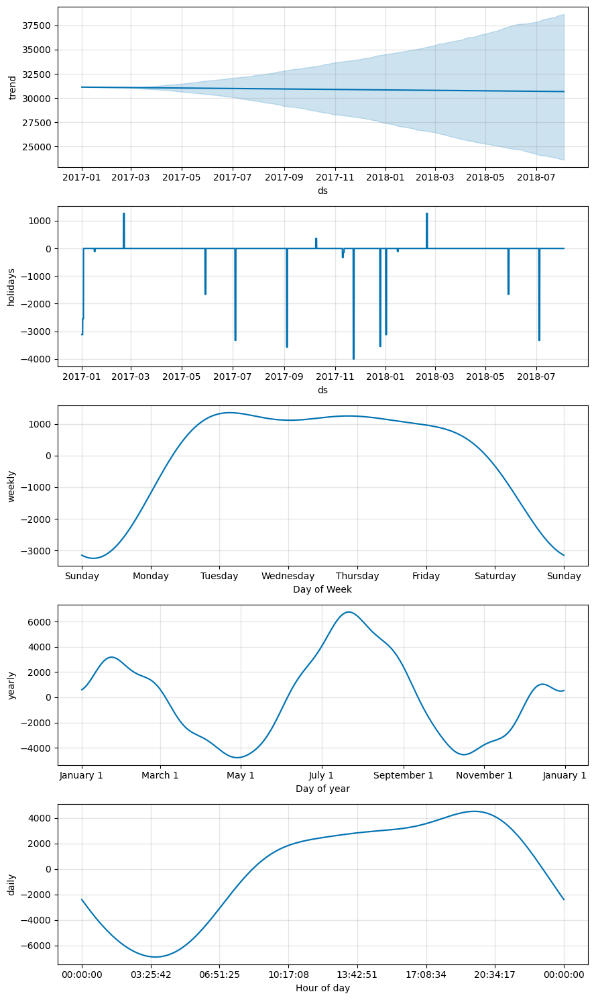

In [15]:
fig = model.plot_components(forecast)

In [18]:
forecast.columns

Index(['ds', 'trend', 'yhat_lower', 'yhat_upper', 'trend_lower', 'trend_upper',
       'Christmas Day', 'Christmas Day_lower', 'Christmas Day_upper',
       'Christmas Day (Observed)', 'Christmas Day (Observed)_lower',
       'Christmas Day (Observed)_upper', 'Columbus Day', 'Columbus Day_lower',
       'Columbus Day_upper', 'Independence Day', 'Independence Day_lower',
       'Independence Day_upper', 'Independence Day (Observed)',
       'Independence Day (Observed)_lower',
       'Independence Day (Observed)_upper', 'Labor Day', 'Labor Day_lower',
       'Labor Day_upper', 'Martin Luther King Jr. Day',
       'Martin Luther King Jr. Day_lower', 'Martin Luther King Jr. Day_upper',
       'Memorial Day', 'Memorial Day_lower', 'Memorial Day_upper',
       'New Year's Day', 'New Year's Day_lower', 'New Year's Day_upper',
       'New Year's Day (Observed)', 'New Year's Day (Observed)_lower',
       'New Year's Day (Observed)_upper', 'Thanksgiving', 'Thanksgiving_lower',
       'Thanksgiv

In [22]:
trend_component = forecast['trend']
daily_component = forecast['daily']
weekly_component = forecast['weekly']
holiday_component = forecast['holidays']
yearly_component = forecast['yearly']


components_df = pd.DataFrame({
    'ds': forecast['ds'],
    'trend': trend_component,
    'daily': daily_component,
    'holidays': holiday_component,
    'weekly': weekly_component,
    'yearly': yearly_component,
})

components_df.head()


,ds,trend,daily,holidays,weekly,yearly
0,2017-01-01 00:00:00,31131.086967,-2395.664945,-3117.031207,-3152.009133,607.297759
1,2017-01-01 01:00:00,31131.054013,-4390.452789,-3117.031207,-3194.281750,609.958522
2,2017-01-01 02:00:00,31131.021059,-5872.233557,-3117.031207,-3224.861637,612.650349
3,2017-01-01 03:00:00,31130.988105,-6728.121767,-3117.031207,-3243.439323,615.373217
4,2017-01-01 04:00:00,31130.955150,-6856.738028,-3117.031207,-3249.787039,618.127104


In [25]:
'string'.title()

'String'

In [36]:
import plotly.graph_objects as go
from plotly.subplots import make_subplots

component_cols = components_df.columns[1:]

fig = make_subplots(
    rows=len(component_cols),
    cols=1,
    subplot_titles=[col.title() for col in component_cols],
    vertical_spacing=0.05,
    shared_xaxes=True
)

for i, col in enumerate(component_cols):
    fig.add_trace(
        go.Scatter(
            x=components_df["ds"],
            y=components_df[col],
            name=col.title(),
            # title=col.title(),
        ),
        row=i + 1,
        col=1,
    )


# Customize the layout
fig.update_layout(
    title="Prophet Model Components",
    # xaxis_title="Date",
    height=1_000,
    width=800,
    showlegend=True,
)

# Show the plot
fig.show()
